In [122]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage._utils import gene_plot, Read10X, ReadOldST, tiling, scale_img, calculate_bg
from stimage._model import CNN_NB_multiple_genes, negative_binomial_layer, negative_binomial_loss
from stimage._data_generator import DataGenerator, DataGenerator_LSTM_one_output
from stimage._img_normaliser import IterativeNormaliser
import tensorflow as tf
import seaborn as sns
sns.set_style("white")
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np
# import geopandas as gpd
from sklearn.neighbors import KDTree
import anndata
from anndata import read_h5ad
from tensorflow.keras import backend as K
from itertools import product
from scipy.stats import zscore

In [2]:
import matplotlib.pyplot as plt
from libpysal.weights.contiguity import Queen
from libpysal import examples
import numpy as np
import pandas as pd
import geopandas as gpd
import os
import splot
from splot.esda import moran_scatterplot, lisa_cluster
from esda.moran import Moran, Moran_Local
from esda.moran import Moran_BV, Moran_Local_BV
from splot.esda import plot_moran_bv_simulation, plot_moran_bv, plot_local_autocorrelation

In [128]:
from matplotlib import pyplot as plt
import numpy as np
from typing import Optional, Union
from anndata import AnnData


def Bifeature_plot(
    adata: AnnData,
    library_id: str = None,
    name: str = None,
    data_alpha: float = 0.8,
    tissue_alpha: float = 1.0,
    cmap: str = "Spectral_r",
    spot_size: tuple = (5, 40),
    ob1: str = None,
    ob2: str = None,
    col: int = None,
    show_color_bar: bool = True,
    show_size_legend: bool = True,
    show_axis: bool = False,
    cropped: bool = True,
    margin: int = 100,
    dpi: int = 150,
    output: str = None,
) -> Optional[AnnData]:


    imagecol = adata.obs["imagecol"]
    imagerow = adata.obs["imagerow"]
    from sklearn.preprocessing import MinMaxScaler

    ob_1 = adata.obsm[ob1][:,col]
    scaler = MinMaxScaler(feature_range=spot_size)
    ob1_size = scaler.fit_transform(ob_1.reshape(-1, 1))
    ob_2 = adata.obsm[ob2][:,col]
#     print(ob_1)
#     print(ob_2)
    # plt.rcParams['figure.dpi'] = dpi

    # Option for turning off showing figure
    plt.ioff()

    # Initialize matplotlib
    fig, a = plt.subplots()

    vmin = min(ob_2)
    vmax = max(ob_2)
    # Plot scatter plot based on pixel of spots
    plot = a.scatter(
        adata.obs["imagecol"],
        adata.obs["imagerow"],
        edgecolor="none",
        alpha=data_alpha,
        s=ob1_size,
        marker="o",
        vmin=vmin,
        vmax=vmax,
        cmap=plt.get_cmap(cmap),
        c=ob_2,
    )

    if show_color_bar:
        from mpl_toolkits.axes_grid1.inset_locator import inset_axes
        axins = inset_axes(a,
                   width="100%",
                   height="100%",
                   loc='upper left',
                   bbox_to_anchor=(1.0, 0.73, 0.05, 0.35),
                   bbox_transform=a.transAxes,
                   borderpad=4.3,
                   )
        cb = plt.colorbar(plot, cax=axins)
        cb.ax.set_xlabel(ob2, fontsize=10)
        cb.ax.xaxis.set_label_coords(0.98, 1.20)
        cb.outline.set_visible(False)

    if show_size_legend:
        size_min, size_max = spot_size
        markers = [size_min, size_min + 1 / 3 * (size_max - size_min),
                   size_min + 2 / 3 * (size_max - size_min), size_max]
        legend_markers = [plt.scatter([], [], s=i, c="grey") for i in markers]
        labels = ["{:.2f}".format(float((scaler.inverse_transform(np.array(i).reshape(1, 1)))))
                  for i in markers]
        a.legend(handles=legend_markers, labels=labels, loc='lower left', bbox_to_anchor=(1, 0.05),
                   scatterpoints=1, frameon=False, title=ob1)

    if not show_axis:
        a.axis("off")
    if library_id is None:
        library_id = list(adata.uns["spatial"].keys())[0]

    image = adata.uns["spatial"][library_id]["images"][
        adata.uns["spatial"][library_id]["use_quality"]
    ]
    # Overlay the tissue image
    a.imshow(
        image,
        alpha=tissue_alpha,
        zorder=-1,
    )

    if cropped:
        a.set_xlim(imagecol.min() - margin, imagecol.max() + margin)

        a.set_ylim(imagerow.min() - margin, imagerow.max() + margin)

        a.set_ylim(a.get_ylim()[::-1])
        # plt.gca().invert_yaxis()

    # fig.tight_layout()
    if output is not None:
        fig.savefig(output + "/" + name, dpi=dpi, bbox_inches="tight", pad_inches=0)

    plt.show()




In [72]:
def thumbnail(img, size = (1000,1000)):
    """Converts Pillow images to a different size without modifying the original image
    """
    img_thumbnail = img.copy()
    img_thumbnail.thumbnail(size)
    return img_thumbnail

In [17]:
from openslide import open_slide
from PIL import Image, ImageOps, ImageChops
import numpy as np

def highest_mag(slide):
    """Returns the highest magnification for the slide
    """
    return int(slide.properties['aperio.AppMag'])

def level_mags(slide):
    """Returns the magnification for each level in a slide
    """
    return [highest_mag(slide)/downsample for downsample in slide.level_downsamples]

def get_level_size(slide, level):
    """Returns the dimensions of a level
    """
    return slide.level_dimensions[level]

def get_level_mag(slide, level):
    """Returns the magnification at a particular level
    """
    return level_mags(slide)[level]

def get_level_for_mag(slide, mag):
    """Get the level corresponding to a certain magnification, if available
    """
    level_mags_rounded = list(np.round(level_mags(slide), decimals = 2))
    if mag in level_mags_rounded:
        return level_mags_rounded.index(mag)
    else: 
        return None
    
def get_mag_for_size(slide, size):
    """Get the magnification corresponding to an image size at the highest magnification
    """
    max_size = slide.dimensions
    max_mag = highest_mag(slide)
    downsample = np.average([max_dim/size_dim for max_dim, size_dim in zip(max_size, size)])
    return max_mag/downsample

def get_size_for_mag(slide, mag):
    """Get the image size the highest magnification image would have to be resized to get an equivalent magnification
    """
    max_size = slide.dimensions
    max_mag = highest_mag(slide)
    downsample = max_mag/mag
    return [np.int(np.round(dim/downsample)) for dim in max_size]

def read_slide_at_mag(slide, mag):
    """Outputs at Pillow Image for a particular magnification 
    """
    exact_level = get_level_for_mag(slide, mag)
    if exact_level is not None:
        return slide.read_region((0,0), exact_level, get_level_size(slide, exact_level))
    else:
        max_size = slide.dimensions
        region_size = tuple(get_size_for_mag(slide, mag))
        downsample = np.average([max_dim/region_dim for max_dim, region_dim in zip(max_size, region_size)])
        best_level = slide.get_best_level_for_downsample(downsample)
        best_level_size = get_level_size(slide, best_level)
        best_level_img = slide.read_region((0,0), best_level, best_level_size)
        return best_level_img.resize(region_size, resample = Image.BICUBIC)  

In [3]:
from scipy import stats

def plot_correlation(df, attr_1, attr_2):
    r = stats.pearsonr(df[attr_1], 
                       df[attr_2])[0] **2

    g = sns.lmplot(data=df,
        x=attr_1, y=attr_2,
        height=5, legend=True
    )
    # g.set(ylim=(0, 360), xlim=(0,360))

    g.set_axis_labels(attr_1, attr_2)
    plt.annotate(r'$R^2:{0:.2f}$'.format(r),
                (max(df[attr_1])*0.9, max(df[attr_2])*0.9))
    return g


def calculate_correlation(attr_1, attr_2):
    r = stats.pearsonr(attr_1, 
                       attr_2)[0]
    return r

def calculate_correlation_2(attr_1, attr_2):
    r = stats.spearmanr(attr_1, 
                       attr_2)[0]
    return r

In [7]:
gene_list=["COX6C","TTLL12", "PABPC1", "GNAS", "HSP90AB1", 
           "TFF3", "ATP1A1", "B2M", "FASN", "SPARC", "CD74", "CD63", "CD24", "CD81"]
n_genes = len(gene_list)

In [8]:
K.clear_session()
model = CNN_NB_multiple_genes((299, 299, 3), n_genes)
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20,
                                            restore_best_weights=False)

In [9]:
model.load_weights("./CNN_NB_9visium_no_norm.h5")

In [83]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)
SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [88]:
template_img = Sample1.uns["spatial"][SAMPLE]['images']["fulres"]
template_img = Image.fromarray(template_img.astype("uint8"))

normaliser = IterativeNormaliser(normalisation_method='vahadane', standardise_luminosity=True)
normaliser.fit_target(scale_img(template_img))

In [10]:
TCGA_PATH = Path("/clusterdata/uqxtan9/Q2051/STimage_project/STimage_dataset/RAW/TCGA_BRCA/64ed8ea4-00a2-4059-a2a0-897f144a6975")

In [11]:
slides = []
for slide in TCGA_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()

In [18]:
for slide in slides:
    he_slide = open_slide(str(TCGA_PATH.joinpath(slide)))
    he_pil = read_slide_at_mag(he_slide, 20)

<ipython-input-17-97130ba44dd3>:48: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return [np.int(np.round(dim/downsample)) for dim in max_size]


In [61]:
he_pil_rgb = he_pil.convert('RGB')

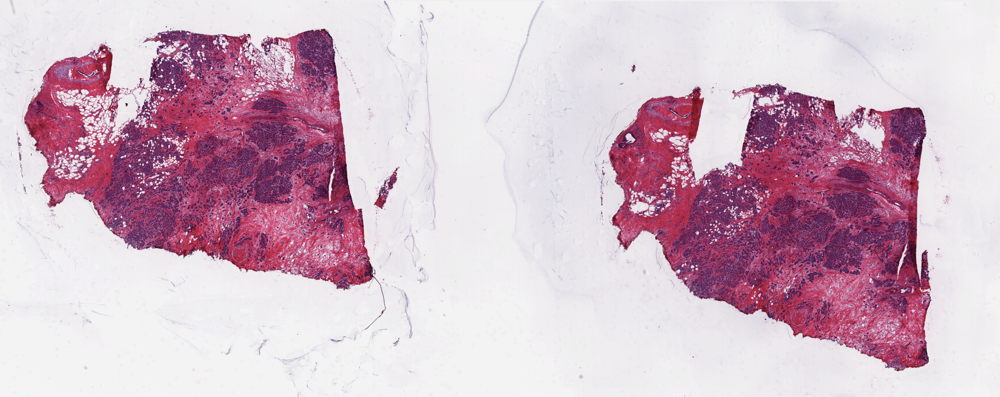

In [73]:
thumbnail(he_pil_rgb)

In [93]:
def create_adata(he_pil, crop_size, library_id, gene_list):
    
    array_row = (he_pil.size[1] // crop_size) - 2
    array_col = (he_pil.size[0] // crop_size) - 2
    
    df_obs = pd.DataFrame(product(range(array_row), range(array_col)), columns = ["arrayrow", "arraycol"])
    df_obs["imagerow"] = df_obs["arrayrow"]*crop_size + crop_size / 2
    df_obs["imagecol"] = df_obs["arraycol"]*crop_size + crop_size / 2
    df_obs.index = df_obs["arrayrow"].astype(str) +"x"+ df_obs["arraycol"].astype(str)
    
    df_mtx = pd.DataFrame(0, index=df_obs.index, columns=gene_list)
    
    adata = anndata.AnnData(X=df_mtx,
                        obs=df_obs)
    
    adata.uns = dict()
    adata.uns["spatial"] = dict()
    adata.uns["spatial"][library_id] = dict()
    adata.uns["spatial"][library_id]["images"] = dict()
    adata.uns["spatial"][library_id]["images"]["fulres"] = np.array(he_pil)
    adata.uns["spatial"][library_id]["use_quality"] = "fulres"
    
    return adata

In [94]:
adata = create_adata(he_pil_rgb, 299, "GCTA", gene_list)

In [95]:
tile_filtering_threshold = 0.8
calculate_bg(adata, crop_size=299, stain_normaliser=normaliser)
tile_to_remove = sum(adata.obs["tissue_area"] < tile_filtering_threshold)
adata = adata[adata.obs["tissue_area"] >= tile_filtering_threshold].copy()

Tiling image: 100%|██████████ [ time left: 00:00 ]


In [96]:
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

In [97]:
tiling(adata, TILE_PATH, crop_size=299, stain_normaliser=normaliser)

Tiling image: 100%|██████████ [ time left: 00:00 ]


In [98]:
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=adata, 
                          genes=gene_list), 
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
test_gen_ = test_gen.batch(1)

In [103]:
test_predictions = model.predict(test_gen_)
from scipy.stats import nbinom
y_preds_mean = []
y_preds_var = []
for i in range(n_genes):
    n = test_predictions[i][:, 0]
    p = test_predictions[i][:, 1]
#     y_pred = nbinom.mean(n, p)
    y_pred_mean, y_pred_var = nbinom.stats(n, p, moments='mv')
    y_preds_mean.append(y_pred_mean)
    y_preds_var.append(y_pred_var)
adata.obsm["predicted_gene_mean"] = np.array(y_preds_mean).transpose()
adata.obsm["predicted_gene_var"] = np.array(y_preds_var).transpose()

In [104]:
test_dataset_1 = adata[:,gene_list].copy()
test_dataset_1.X = test_dataset_1.obsm["predicted_gene_mean"]

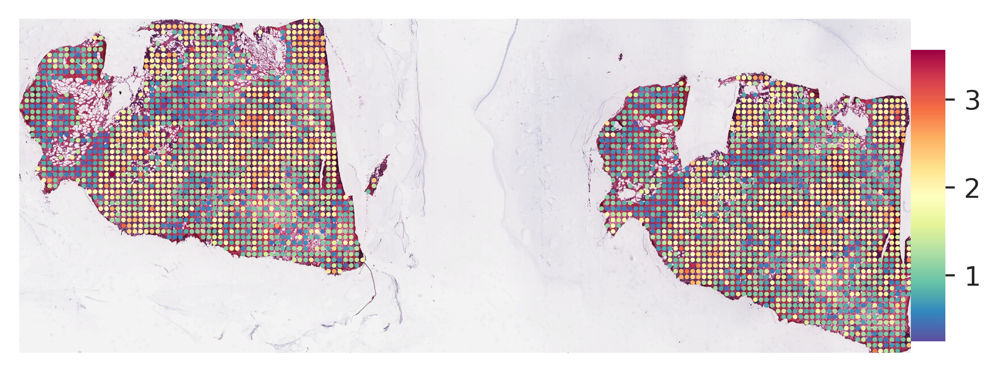

In [105]:
gene_plot(test_dataset_1, genes="COX6C", spot_size=3)

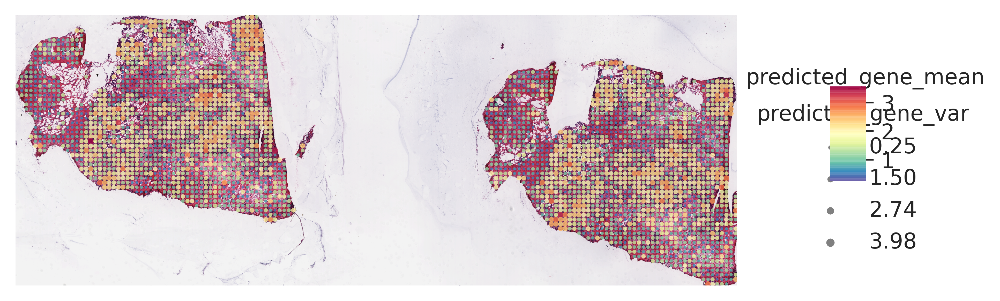

In [110]:
Bifeature_plot(test_dataset_1, 
               ob1="predicted_gene_var", 
               ob2="predicted_gene_mean", 
               col=test_dataset_1.var_names.get_loc("COX6C"),
               spot_size = (1, 8))

In [124]:
test_dataset_1_z = test_dataset_1.copy()
test_dataset_1_z.X = zscore(test_dataset_1_z.X, axis=0)

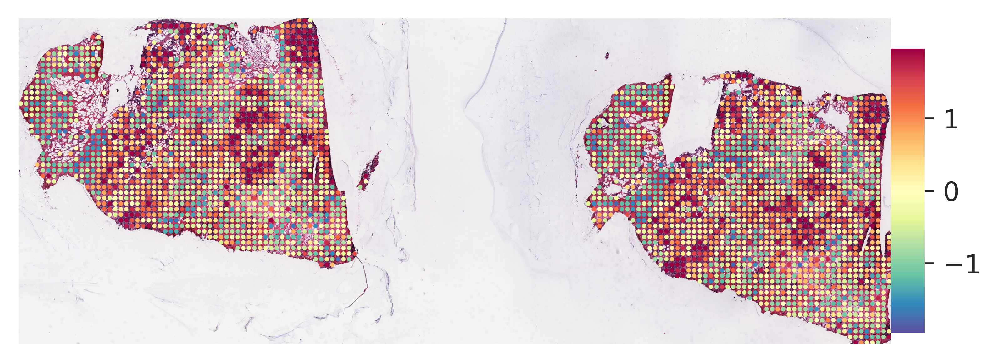

In [127]:
gene_plot(test_dataset_1_z, genes="COX6C", spot_size=3, vmin=-1.96, vmax=1.96)